<a href="https://colab.research.google.com/github/deepakshekhawat1209/netflix_movies_and_tv_shows/blob/main/unsupervised_ML_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project Name**    - Netflix Movies & TV Shows Clustering



##### **Project Type**    - Unsupervised
##### **Contribution**    - Individual


# **Project Summary -**

Write the summary here within 500-600 words.

# **GitHub Link -**

Provide your GitHub Link here.

# **Problem Statement**


This dataset consists of tv shows and movies available on Netflix as of 2019. The dataset is collected from Flixable which is a third-party Netflix search engine.

In 2018, they released an interesting report which shows that the number of TV shows on Netflix has nearly tripled since 2010. The streaming service’s number of movies has decreased by more than 2,000 titles since 2010, while its number of TV shows has nearly tripled. It will be interesting to explore what all other insights can be obtained from the same dataset.

Integrating this dataset with other external datasets such as IMDB ratings, rotten tomatoes can also provide many interesting findings.

## <b>In this  project, you are required to do </b>
1. Exploratory Data Analysis 

2. Understanding what type content is available in different countries

3. Is Netflix has increasingly focusing on TV rather than movies in recent years.
4. Clustering similar content by matching text-based features



# ***Let's Begin !***

### Importing Libraries

In [8]:
# useful Libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import missingno as msno
import warnings
warnings.filterwarnings('ignore')

### Dataset Loading

In [9]:
#mounting the drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [10]:
# Load Dataset
data=pd.read_csv('/content/drive/MyDrive/AlmaBetter/NETFLIX MOVIES AND TV SHOWS CLUSTERING.csv')

In [11]:
df1=data.copy

### Dataset First View

In [12]:
# Dataset First Look
data.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow..."
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi..."
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...


### Dataset Rows & Columns count

In [13]:
# Dataset Rows & Columns count
data.shape

(7787, 12)

### Dataset Information

In [14]:
# Dataset Info
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7787 entries, 0 to 7786
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       7787 non-null   object
 1   type          7787 non-null   object
 2   title         7787 non-null   object
 3   director      5398 non-null   object
 4   cast          7069 non-null   object
 5   country       7280 non-null   object
 6   date_added    7777 non-null   object
 7   release_year  7787 non-null   int64 
 8   rating        7780 non-null   object
 9   duration      7787 non-null   object
 10  listed_in     7787 non-null   object
 11  description   7787 non-null   object
dtypes: int64(1), object(11)
memory usage: 730.2+ KB


#### Duplicate Values

In [15]:
# Dataset Duplicate Value Count
data[data.duplicated()]

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description


#### Missing Values/Null Values

In [16]:
# Missing Values/Null Values Count
data.isnull().sum().sort_values(ascending=False)

director        2389
cast             718
country          507
date_added        10
rating             7
show_id            0
type               0
title              0
release_year       0
duration           0
listed_in          0
description        0
dtype: int64

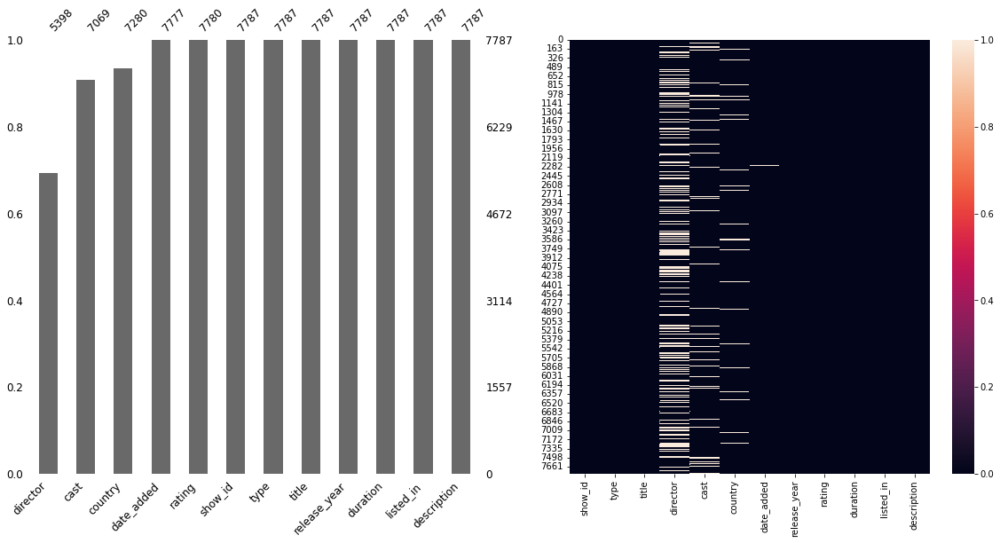

In [17]:
# Visualizing the missing values
fig, axs = plt.subplots(1,2, figsize=(20,9))
msno.bar(data,sort='ascending',ax=axs[0], fontsize=12)
sns.heatmap(data.isnull(),ax=axs[1])

### Brief note about the dataset--->

There are 7787 values or rows and 12 columns or features.Most of the features of our dataset are textual in nature and a few are numerical in nature. Some features like director,cast etc are having null values but the best part is our dataset is free from duplicacy. 

## Understanding Variables

In [18]:
# Dataset Columns
data.columns

Index(['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added',
       'release_year', 'rating', 'duration', 'listed_in', 'description'],
      dtype='object')

In [19]:
# Dataset Describe
data.describe(include='all')

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
count,7787,7787,7787,5398,7069,7280,7777,7787.000000,7780,7787,7787,7787
unique,7787,2,7787,4049,6831,681,1565,NaN,14,216,492,7769
top,s1,Movie,3%,"Raúl Campos, Jan Suter",David Attenborough,United States,"January 1, 2020",NaN,TV-MA,1 Season,Documentaries,Multiple women report their husbands as missin...
freq,1,5377,1,18,18,2555,118,NaN,2863,1608,334,3
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013.932580,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.757395,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1925.000000,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013.000000,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2017.000000,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2018.000000,NaN,NaN,NaN,NaN


### Variables Description 

1. show_id : Unique ID for every Movie / Tv Show

2. type : Identifier - A Movie or TV Show

3. title : Title of the Movie / Tv Show

4. director : Director of the Movie

5. cast : Actors involved in the movie / show

6. country : Country where the movie / show was produced

7. date_added : Date it was added on Netflix

8. release_year : Actual Releaseyear of the movie / show

9. rating : TV Rating of the movie / show

10. duration : Total Duration - in minutes or number of seasons

11. listed_in : Genere

12. description: The Summary description

#Handling missing and null values

In [20]:
# Replacing missing values with zero
data['rating'] = data['rating'].fillna(0)

# Replacing missing values with 'Unknown'
data['director'] = data['director'].fillna('Unknown')
data['cast'] = data['cast'].fillna('Unknown')

# Replacing missing values with 'No Description'
data['description'] = data['description'].fillna('No Description')

data['country'] = data['country'].fillna('')

# drop missing 
data.dropna(inplace=True)

In [21]:
#checking missing values again
data.isnull().sum()

show_id         0
type            0
title           0
director        0
cast            0
country         0
date_added      0
release_year    0
rating          0
duration        0
listed_in       0
description     0
dtype: int64

### Check Unique Values for each variable.

In [22]:
# Check Unique Values for each variable.
data.nunique()

show_id         7777
type               2
title           7777
director        4050
cast            6822
country          682
date_added      1565
release_year      73
rating            15
duration         216
listed_in        491
description     7759
dtype: int64

## Data Visualization

##univariate analysis

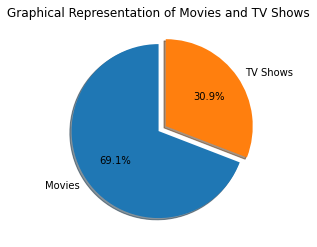

In [23]:
#visualization code
movie_rows = data.loc[data["type"] == "Movie"]
tv_rows = data.loc[data["type"] == "TV Show"]
movies_per = round(movie_rows.shape[0] / data["type"].shape[0] * 100, 2)
tvshows_per = round(tv_rows.shape[0] /data["type"].shape[0] * 100, 2)
plt.pie([movies_per, tvshows_per], explode=(0, 0.1,), labels=["Movies", "TV Shows"], autopct='%1.1f%%',
        shadow=True, startangle=90)
plt.title('Graphical Representation of Movies and TV Shows')
plt.show()

Since 'type' feature of our dataset has only two unique values, so i found pie chart to be the best which represent these in a meaningful and simple way.

##Some insights from the chart


69% of the data belongs to 'movies' and the rest 31% to 'TV shows'.






#Title

In [24]:
#visualization code
#word cloud imports
from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

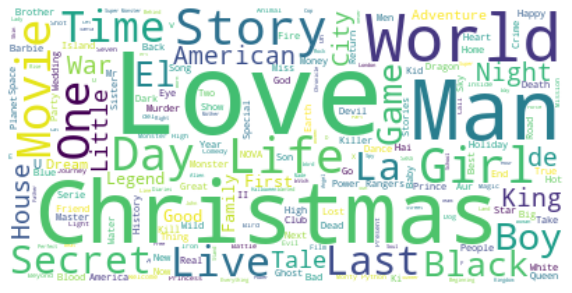

In [25]:
#subsetting data
df_word_cloud = data['title']
text = " ".join(word for word in df_word_cloud)
# Create stopword list:
stopwords = set(STOPWORDS)
# Generate a word cloud image
plt.figure(figsize = (10, 8), facecolor = None)
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)
# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

Word cloud image is very helpful visualisation technique to visualise the textual data where we get familiar with most repeated words.

##Some insighs from the chart

It seems words like "Love", "Man", "World", "Story","Christmas" etc are very common in titles. By seeing these words, it seems that most of the movies and TV shows are based on the love story around the world which are released in the month of december near Christmas.

## Most popular Directors

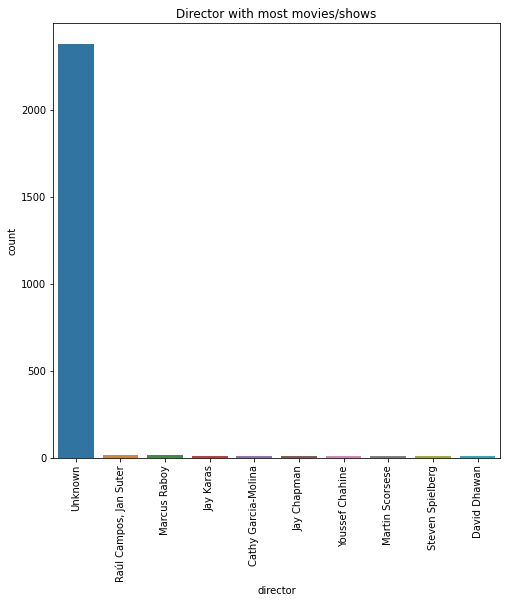

In [26]:
#plot for director
plt.figure(figsize = (8,8))
sns.countplot(x='director',data=data,order=data.director.value_counts().head(10).index)
plt.title('Director with most movies/shows')
plt.xticks(rotation = 90)
plt.show()

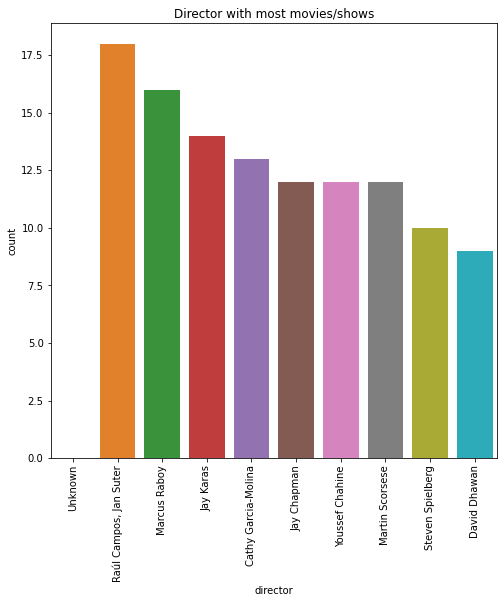

In [27]:
plt.figure(figsize = (8,8))
sns.countplot(x='director',data=data[data.director!='Unknown'],order=data.director.value_counts().head(10).index)
plt.title('Director with most movies/shows')
plt.xticks(rotation = 90)
plt.show()

countplot is used to show the counts of observations in each categorical bin using bars.

#some key insights:

The count of unknown director is very high as per the first plot and if we ignored it, that i have done in second plot, we get the list of top 9 directors.

# Cast

In [28]:
#cast overview
data.cast

0       João Miguel, Bianca Comparato, Michel Gomes, R...
1       Demián Bichir, Héctor Bonilla, Oscar Serrano, ...
2       Tedd Chan, Stella Chung, Henley Hii, Lawrence ...
3       Elijah Wood, John C. Reilly, Jennifer Connelly...
4       Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...
                              ...                        
7782    Imad Creidi, Antoinette Turk, Elias Gergi, Car...
7783    Vicky Kaushal, Sarah-Jane Dias, Raaghav Chanan...
7784                                              Nasty C
7785                           Adriano Zumbo, Rachel Khoo
7786                                              Unknown
Name: cast, Length: 7777, dtype: object

In [29]:
#convert the actor to get final dataframe for actor
def convert_to_list(data,i):
  '''function returns dictionary of actor withs its count'''
  cast_count = {}
  cast_count_list = []
  cast_list = list(data[i])
  for actor in range(len(cast_list)):
    cast_count_list.extend(str(cast_list[actor]).split(","))
  for each in cast_count_list:
    if each not in cast_count:
      cast_count[each] = cast_count_list.count(each)
  df = pd.DataFrame.from_dict(cast_count, orient='index', columns=['count'])
  return df

In [30]:
#calling function to get actor and its count
casts_df=convert_to_list(data,'cast')
casts_df_movies=convert_to_list(data[data["type"] == "Movie"],'cast')
casts_df_tv_shows=convert_to_list(data[data["type"] == "TV Show"],'cast')

## Top Actors with highest count of Movies

In [31]:
#highest number movie for actors
actors_df=casts_df.sort_values('count', ascending=False).drop('Unknown')
actors_df_movies=casts_df_movies.sort_values('count', ascending=False).drop('Unknown')
actors_df_tv_shows=casts_df_tv_shows.sort_values('count', ascending=False).drop('Unknown')
actors_df

,count
Anupam Kher,38
Takahiro Sakurai,28
Shah Rukh Khan,27
Om Puri,27
Boman Irani,25
...,...
Ana-María Sánchez,1
Orlando Valenzuela,1
Ricardo Mejia,1
Juan Manuel Diaz,1


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19]), <a list of 20 Text major ticklabel objects>)

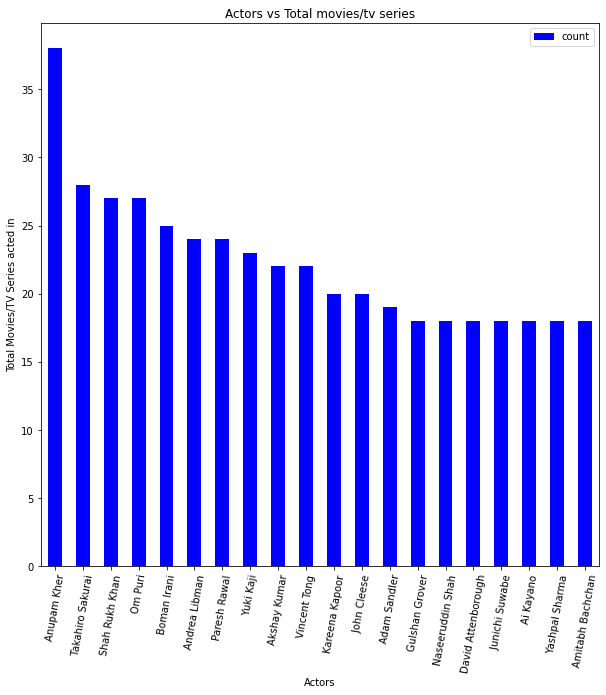

In [32]:
 # plot for top actors and count
plt.rcParams["figure.figsize"] = (10, 10)
actors_df.head(20).plot(kind='bar', color='blue')
plt.xlabel("Actors")
plt.ylabel("Total Movies/TV Series acted in")
plt.title("Actors vs Total movies/tv series")
plt.xticks(rotation=80)

Text(0.5, 1.0, 'Actors vs Total movies')

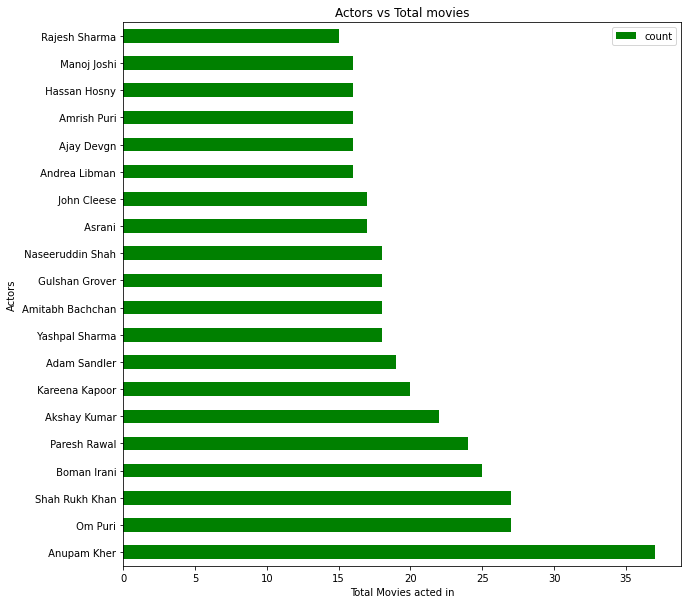

In [33]:
 # plot for top actors and count with respect of movies only
plt.rcParams["figure.figsize"] = (10, 10)
actors_df_movies.head(20).plot(kind='barh', color='green')
plt.ylabel("Actors")
plt.xlabel("Total Movies acted in")
plt.title("Actors vs Total movies")

Text(0.5, 1.0, 'Actors vs Total Tv Shows')

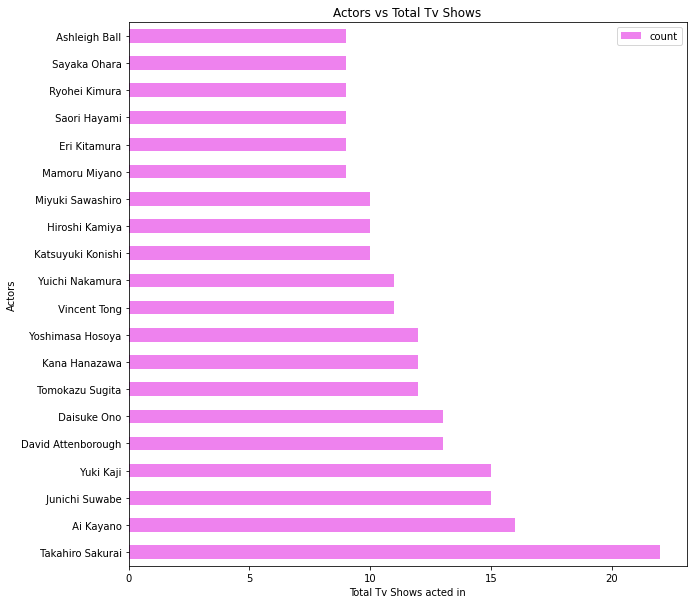

In [34]:
 # plot for top actors and count with respect to tv shows only
plt.rcParams["figure.figsize"] = (10, 10)
actors_df_tv_shows.head(20).plot(kind='barh', color='violet')
plt.ylabel("Actors")
plt.xlabel("Total Tv Shows acted in")
plt.title("Actors vs Total Tv Shows")

Bar charts is best to be used when we want to show segments of information.

#Key insights

1)  Anupam Kher, Om Puri, Shah Rukh Khan, Boman Irani, Paresh Rawal, Akshay Kumar are among top 10 actors acted in movies.

2)  Takahiro Sakurai,	Ai Kayano,	Junichi Suwabe,	Yuki Kaji,	David Attenborough	are among top 10 actors acted in TV Shows.




#Country

In [35]:
#calling function to get country and its count
country_df=convert_to_list(data,'country').reset_index()
country_df.columns=['country','count']
country_df=country_df[country_df['country']!='']
country_df=country_df.groupby('country').sum()
country_df

,count
country,
Afghanistan,1
Albania,1
Algeria,2
Angola,1
Argentina,14
...,...
Uruguay,9
Venezuela,2
Vietnam,5


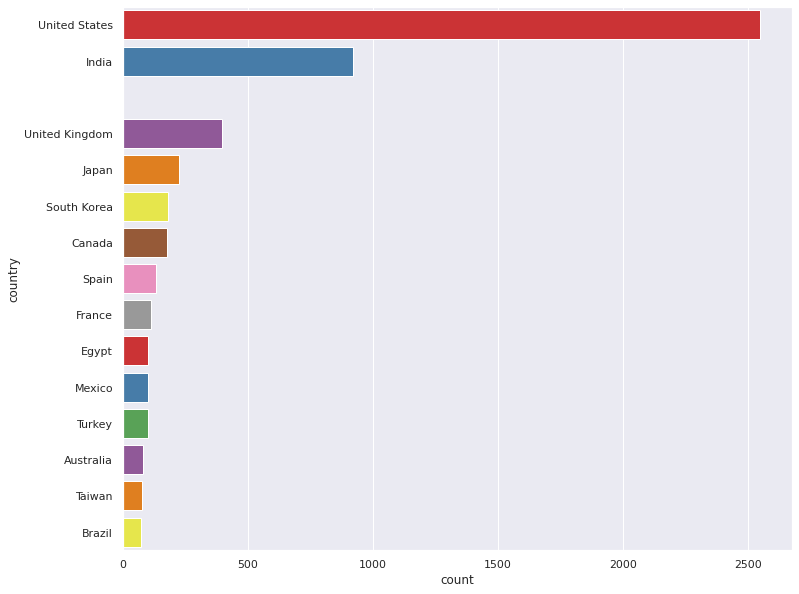

In [36]:
#visualizing the country column:
plt.figure(figsize=(12,10))
sns.set(style="darkgrid")
ax = sns.countplot(y="country", data=data[data['country']!=''], palette="Set1", order=data['country'].value_counts().index[0:15])

In [37]:
#share of movies / tv shows by top 3 countries
data.country.value_counts().nlargest(3).sum()/len(data)*100

51.15082936865115

In [38]:
#share of movies / tv shows by top 10 countries
data.country.value_counts().nlargest(10).sum()/len(data)*100

68.26539796836826

#Key insights

From plot it is cleared that maximum number of Movies and TV Shows are from united states followed by india and united kingdom.

The top 3 countries together account for about 51% of all movies and TV shows in the dataset.


This value increases to about 68% for top ten countries.

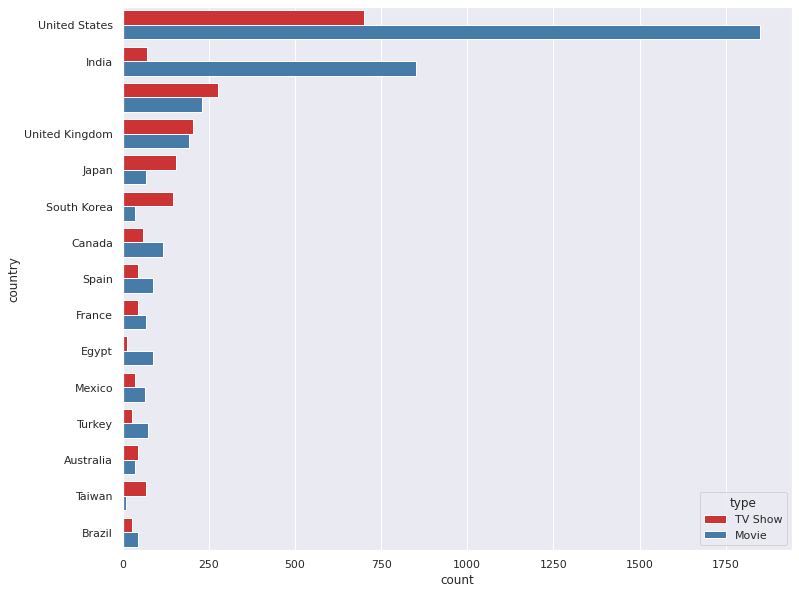

In [39]:
#visualizing country for Movies and Tv shows
plt.figure(figsize=(12,10))
sns.set(style="darkgrid")
ax = sns.countplot(y="country",hue=data['type'], data=data, palette="Set1", order=data['country'].value_counts().index[0:15])

#Key insights

Same is interpreted from the above graph that united state wins the race, maximum number of movies and TV shows are from country united states.

#Date Added

In [40]:
#changed date added to datetime object 
data["date_added"] = pd.to_datetime(data['date_added'])
data['year_added'] = data['date_added'].dt.year
data['month_added'] = data['date_added'].dt.month

#Release Year

Text(0.5, 1.0, 'distribution by released year')

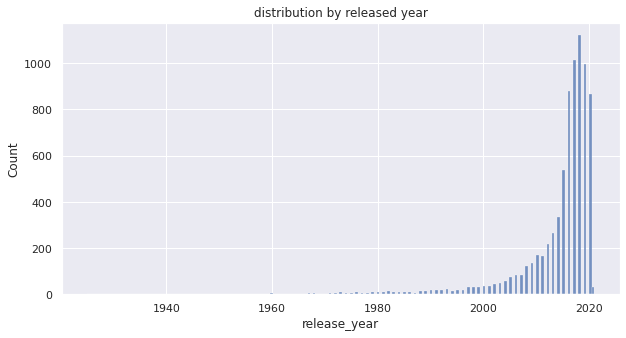

In [41]:
# Visualizing the year in which the movie / tv show was released
plt.figure(figsize=(10,5))
sns.histplot(data['release_year'])
plt.title('distribution by released year')

#key insights

Netflix has greater number of new movies / TV shows than the old ones.

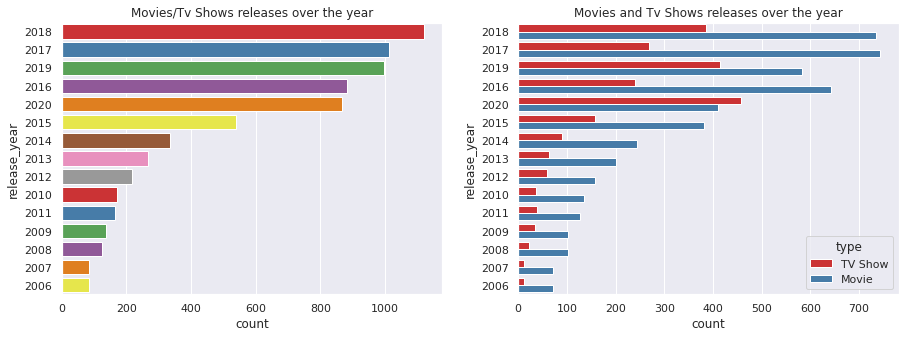

In [42]:
#visualising data vs release year and will look in which year most of the movies and tv shows released
fig, axs = plt.subplots(1,2, figsize=(15,5))
sns.set(style="darkgrid")
ax = sns.countplot(y="release_year", data=data, palette="Set1", order=data['release_year'].value_counts().index[0:15],ax=axs[0]).set(title='Movies/Tv Shows releases over the year')
ax = sns.countplot(y="release_year", data=data, palette="Set1", hue=data['type'],order=data['release_year'].value_counts().index[0:15],ax=axs[1]).set(title='Movies and Tv Shows releases over the year')

Countplot Shows the counts of observations in each categorical bin using bars.

#Key Insights

1) Most of the movies and tv shows are released in 2018 if we consider the effect of both movies and tv shows together.

2)If we consider the effect of movies and tv shows differently, then most of the movies are released in 2017 and tv shows in 2020.

#Rating

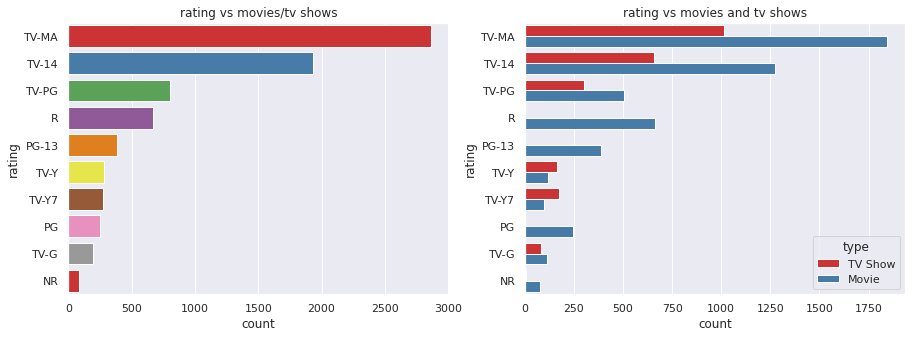

In [43]:
#Visualising rating with movies and tv shows
fig, axs = plt.subplots(1,2, figsize=(15,5))
sns.set(style="darkgrid")
ax = sns.countplot(y="rating", data=data, palette="Set1", order=data['rating'].value_counts().index[0:10],ax=axs[0]).set(title='rating vs movies/tv shows')
ax = sns.countplot(y="rating", data=data, hue=data['type'],palette="Set1", order=data['rating'].value_counts().index[0:10],ax=axs[1]).set(title='rating vs movies and tv shows')

Countplot Shows the counts of observations in each categorical bin using bars.

#Key Insights

Most of the movies and Tv shows are 'TV-MA' and 'TV-14' rated.

#Duration

In [44]:
#Duration column
data.duration

0       4 Seasons
1          93 min
2          78 min
3          80 min
4         123 min
          ...    
7782       99 min
7783      111 min
7784       44 min
7785     1 Season
7786       90 min
Name: duration, Length: 7777, dtype: object

In [45]:
#subsetting TV Show and Movie for duration
netflix_shows=data[data['type']=='TV Show']
netflix_movies=data[data['type']=='Movie']

## Netflix Movie Duration Distribution

In [46]:
#function to remove ' min'
def replace_item(item):
  ''' function which remove min'''
  return item.replace(' min','')

In [47]:
#movie duration subsetting
netflix_movies['duration']=netflix_movies['duration'].astype(str).apply(replace_item)
netflix_movies['duration']=netflix_movies['duration'].astype(str).astype(int)
netflix_movies['duration']

1        93
2        78
3        80
4       123
6        95
       ... 
7781     88
7782     99
7783    111
7784     44
7786     90
Name: duration, Length: 5377, dtype: int64

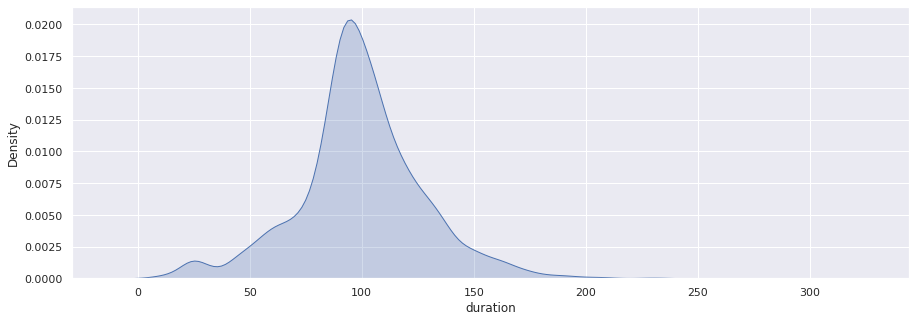

In [48]:
#Analysis on the duration of the movies 
sns.set(style="darkgrid")
plt.figure(figsize=(15,5))
sns.kdeplot(data=netflix_movies['duration'], shade=True)

Kdeplot is a Kernel Distribution Estimation Plot which depicts the probability density function of the continuous or non-parametric data variables i.e. we can plot for the univariate or multiple variables altogether.

#Key insights

Most content are about 70 to 120 min duration for movies

## Netflix Show Duration Distribution

In [49]:
#netflix show duration analysis
netflix_shows['duration']=netflix_shows['duration'].str.replace(' Season','')
netflix_shows['duration']=netflix_shows['duration'].str.replace(' Seasons','')
netflix_shows['duration']=netflix_shows['duration'].str.replace('s','')
netflix_shows['duration']=netflix_shows['duration'].astype(str).astype(int)
netflix_shows['duration']

0       4
5       1
11      1
12      1
16      1
       ..
7767    1
7775    1
7777    2
7779    1
7785    1
Name: duration, Length: 2400, dtype: int64

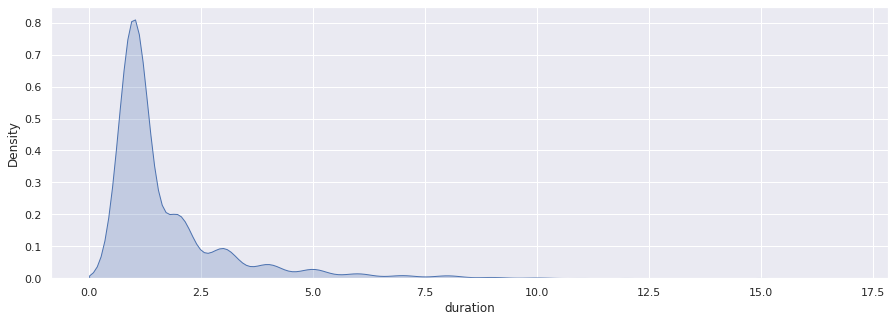

In [50]:
#Analysis on the duration of the movies 
sns.set(style="darkgrid")
plt.figure(figsize=(15,5))
sns.kdeplot(data=netflix_shows['duration'], shade=True)

#Key insights

Most of the shows are 1 to 2 seasons long.

#Listed In

In [51]:
data.listed_in

0       International TV Shows, TV Dramas, TV Sci-Fi &...
1                            Dramas, International Movies
2                     Horror Movies, International Movies
3       Action & Adventure, Independent Movies, Sci-Fi...
4                                                  Dramas
                              ...                        
7782                         Dramas, International Movies
7783       Dramas, International Movies, Music & Musicals
7784    Documentaries, International Movies, Music & M...
7785                   International TV Shows, Reality TV
7786                      Documentaries, Music & Musicals
Name: listed_in, Length: 7777, dtype: object

In [52]:
genre_df=convert_to_list(data,'listed_in')
genre_df=genre_df.sort_values('count', ascending=False)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
        51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
        68, 69, 70, 71, 72]), <a list of 73 Text major ticklabel objects>)

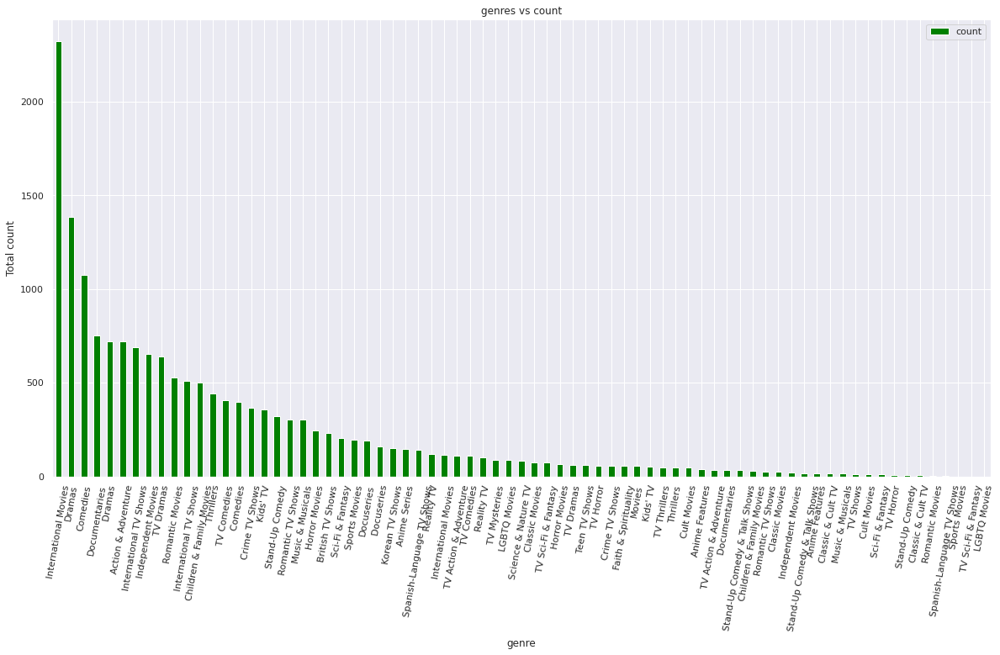

In [53]:
plt.rcParams["figure.figsize"] = (20, 10)
genre_df.plot(kind='bar', color='green')
plt.xlabel("genre")
plt.ylabel("Total count")
plt.title("genres vs count")
plt.xticks(rotation=80)

#Key insights

International Movies make up the top most genre.

In [54]:
#word cloud function
def func_select_Category(category_name,category_column,column_of_choice):
  df_word_cloud = data[[category_column,column_of_choice]].dropna()
  df_word_cloud = df_word_cloud[df_word_cloud[category_column]==category_name]
  text = " ".join(word for word in df_word_cloud[column_of_choice])
  # Create stopword list:
  stopwords = set(STOPWORDS)
  # Generate a word cloud image
  wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)
  # Display the generated image:
  # the matplotlib way:
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis("off")
  plt.show()

#Description

#Word Cloud for Movie on Description Column

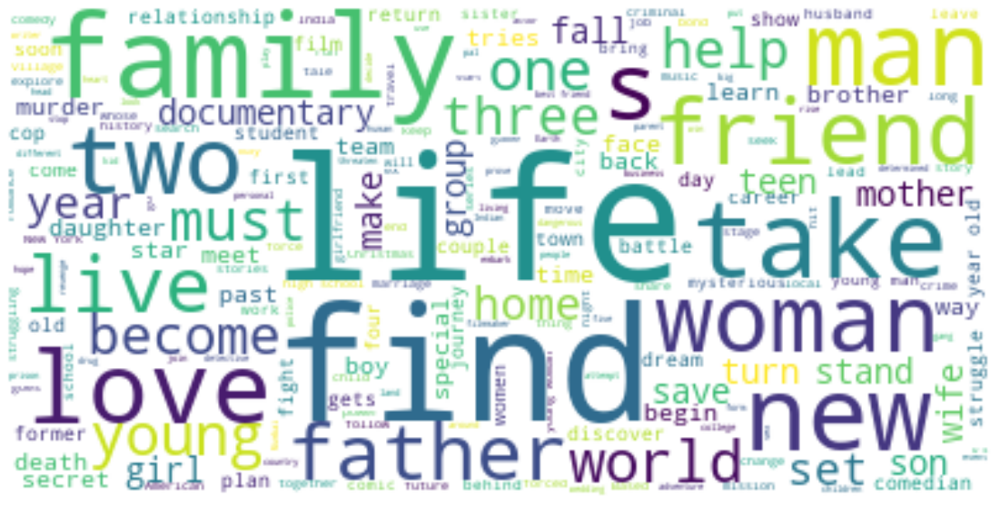

In [55]:
#word cloud for movie
func_select_Category('Movie','type','description')

#Key insights

Most words like Life, family, find are popping up

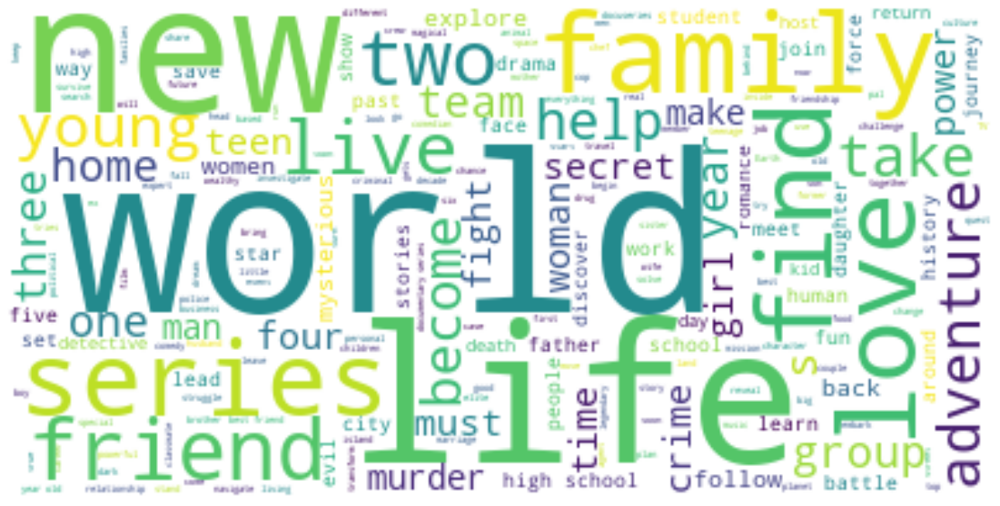

In [56]:
#word cloud for show
func_select_Category('TV Show','type','description')

#Key insights

Most words like World,Life are popping up.

# Bivariate and Trend Analysis

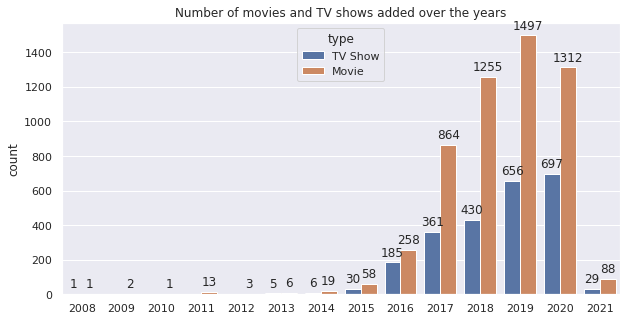

In [57]:
# Number of movies and TV shows added over the years
plt.figure(figsize=(10,5))
p = sns.countplot(x='year_added',data=data, hue='type')
plt.title('Number of movies and TV shows added over the years')
plt.xlabel('')
for i in p.patches:
  p.annotate(format(i.get_height(), '.0f'), (i.get_x() + i.get_width() / 2., i.get_height()), ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')

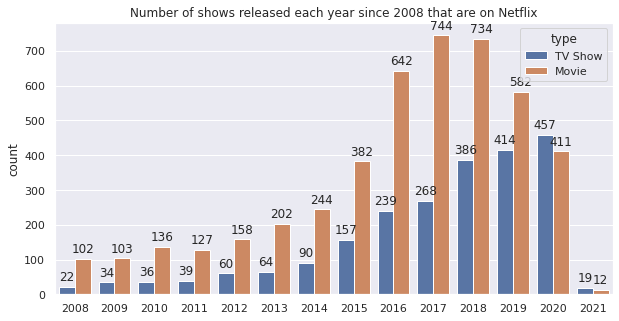

In [58]:
# Number of shows released each year since 2008
order = range(2008,2022)
plt.figure(figsize=(10,5))
p = sns.countplot(x='release_year',data=data, hue='type',
                  order = order)
plt.title('Number of shows released each year since 2008 that are on Netflix')
plt.xlabel('')
for i in p.patches:
  p.annotate(format(i.get_height(), '.0f'), (i.get_x() + i.get_width() / 2., i.get_height()), ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')


#key insights

Over the years, Netflix has consistently focused on adding more shows in its platform.


Though there was a decrease in the number of movies added in 2020, this pattern did not exist in the number of TV shows added in the same year.


This might signal that Netflix is increasingly concentrating on introducing more TV series to its platform rather than movies.

Text(0.5, 1.0, 'Top 10 genres for movies')

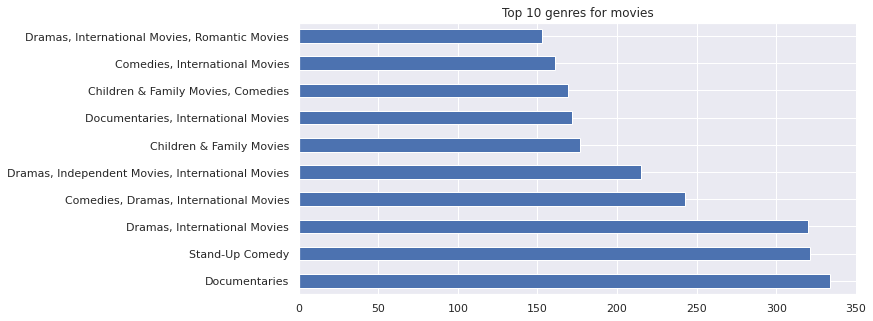

In [59]:
# Top 10 genre for movies
plt.figure(figsize=(10,5))
data[data['type']=='Movie'].listed_in.value_counts().nlargest(10).plot(kind='barh')
plt.title('Top 10 genres for movies')


#key insights

Dramas, comedies, and documentaries are the most popular genre for the movies on Netflix.

Text(0.5, 1.0, 'Top 10 genres for TV Shows')

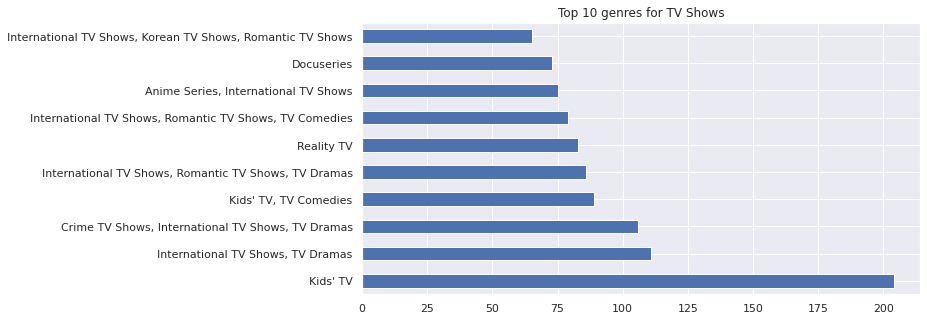

In [60]:
# Top 10 genre for tv shows
plt.figure(figsize=(10,5))
data[data['type']=='TV Show'].listed_in.value_counts().nlargest(10).plot(kind='barh')
plt.title('Top 10 genres for TV Shows')


#key insights

International, crime, and kids are the most popular genre for TV shows on Netflix..

#Country Wise Trend Analysis

* country vs genre
* country vs rating


In [61]:
#genre country wise
def get_genre_country_trends(data):
  def explode_country(country):
    try:
        return country.split(", ")
    except:
        return ""
  data['country_list'] = data.apply(lambda x: explode_country(x['country']),axis=1)
  data = data.explode('country_list')
  data['genre_list'] = data.apply(lambda x: explode_country(x['listed_in']),axis=1)
  data = data.explode('genre_list')
  data.groupby(['country_list','genre_list']).agg({'title':'count'})
  grouped_df_ = data.groupby(['country_list','genre_list']).agg({'title':'count'})
  grouped_df = grouped_df_.reset_index()
  grouped_df['country_list'].values
  grouped_df = grouped_df[grouped_df.country_list != '']
  rating_country_df = grouped_df.reset_index().drop("index", axis=1)
  list_of_countries = list(set(list(rating_country_df['country_list'].values)))
  for each in list_of_countries:
    rating_country_df[rating_country_df['country_list'] == each].sort_values("title",ascending=False).plot.bar(x = "genre_list", y="title", color="skyblue", rot=90, figsize=(9,5))
    plt.title(f"{each}")
  return rating_country_df

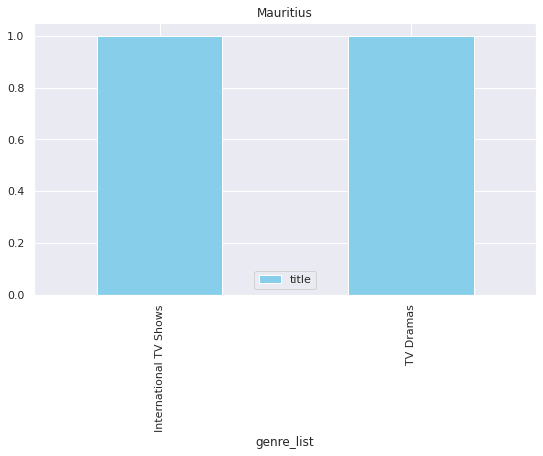

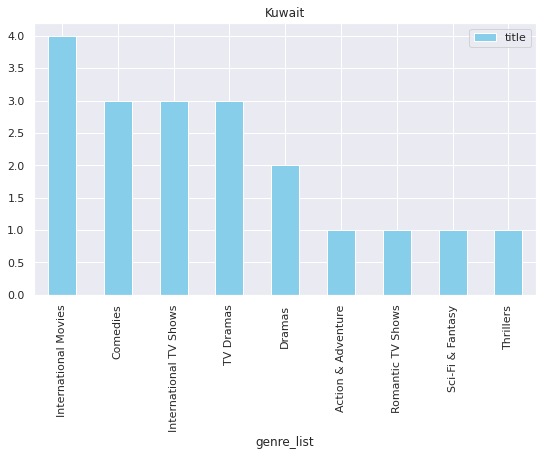

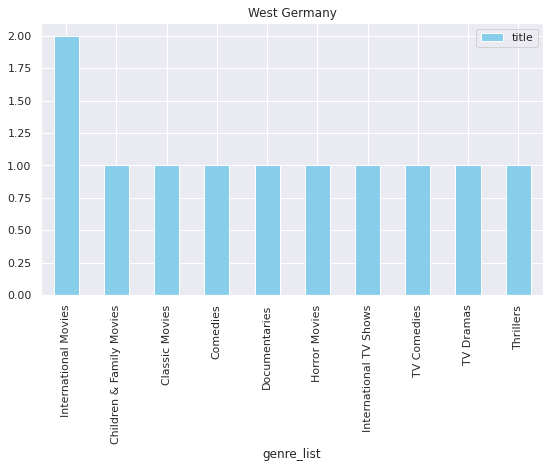

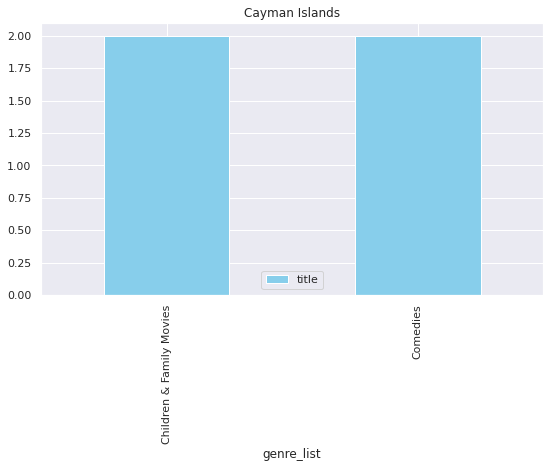

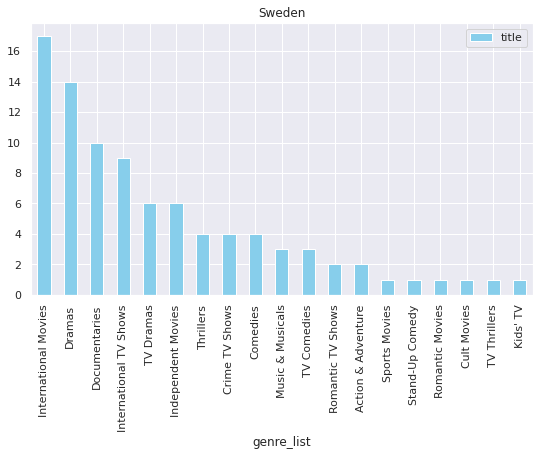

...

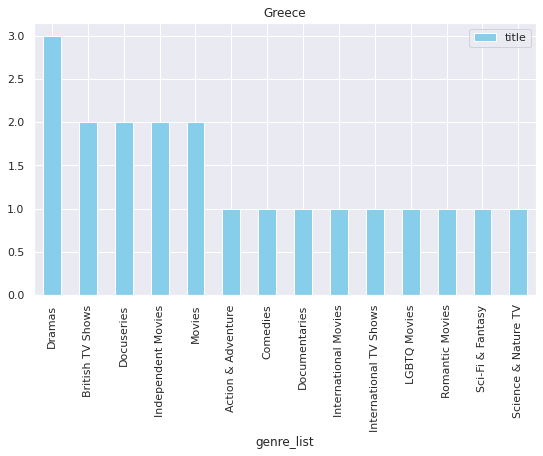

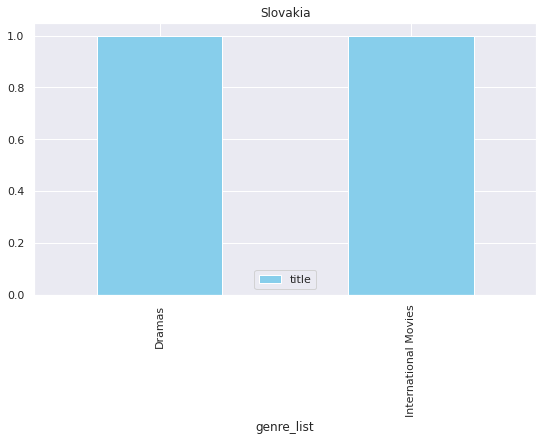

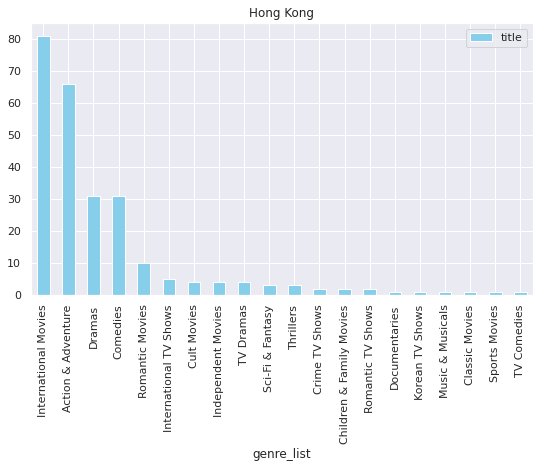

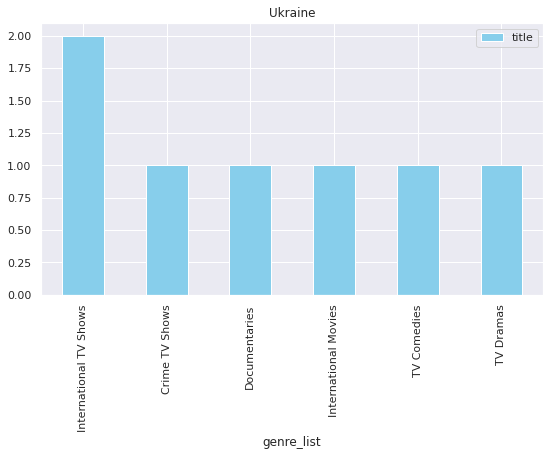

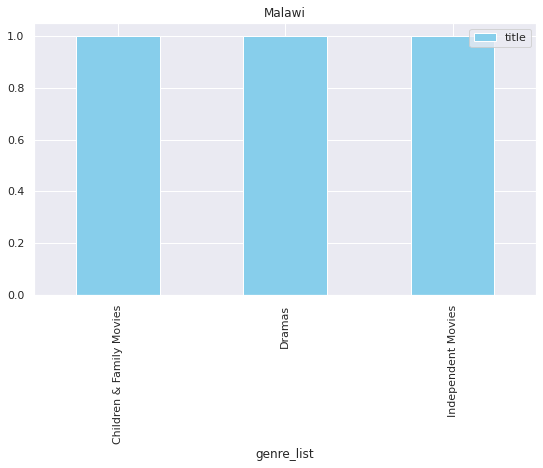

In [62]:
rating_country_df = get_genre_country_trends(data)

In [63]:
#dataframe with only top 3 country
data_country=data[data['country'].isin(['United States','India','United Kingdom'])]

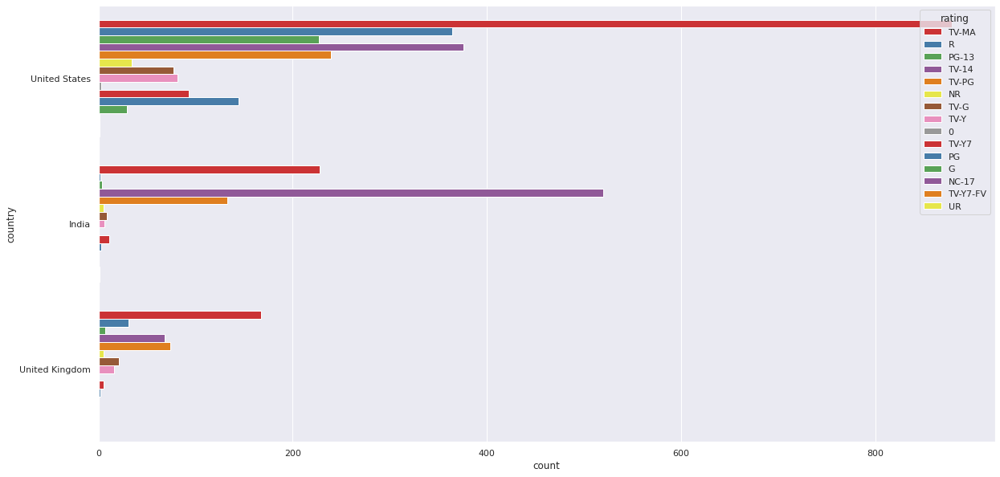

In [64]:
#visualization for country vs rating
ax = sns.countplot(y="country", hue=data['rating'],data=data_country, palette="Set1", order=data_country['country'].value_counts().index[0:15])

#key insights

Movies and TV shows in USA are TV-MA rated while India, they are TV-14 rated.

#Text Based Clustering


In [65]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7777 entries, 0 to 7786
Data columns (total 15 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   show_id       7777 non-null   object        
 1   type          7777 non-null   object        
 2   title         7777 non-null   object        
 3   director      7777 non-null   object        
 4   cast          7777 non-null   object        
 5   country       7777 non-null   object        
 6   date_added    7777 non-null   datetime64[ns]
 7   release_year  7777 non-null   int64         
 8   rating        7777 non-null   object        
 9   duration      7777 non-null   object        
 10  listed_in     7777 non-null   object        
 11  description   7777 non-null   object        
 12  year_added    7777 non-null   int64         
 13  month_added   7777 non-null   int64         
 14  country_list  7777 non-null   object        
dtypes: datetime64[ns](1), int64(3), object

In [66]:
#appending all text column to single text column to work with
data['filtered'] = data['description'].astype(str) + ' ' + data['listed_in'].astype(str) + ' ' + data['rating'].astype(str) + ' '+ data['country'].astype(str)+ ' ' + data['cast'].astype(str) + ' '+ data['director'].astype(str)

In [67]:
data['filtered']

0       In a future where the elite inhabit an island ...
1       After a devastating earthquake hits Mexico Cit...
2       When an army recruit is found dead, his fellow...
3       In a postapocalyptic world, rag-doll robots hi...
4       A brilliant group of students become card-coun...
                              ...                        
7782    When Lebanon's Civil War deprives Zozo of his ...
7783    A scrappy but poor boy worms his way into a ty...
7784    In this documentary, South African rapper Nast...
7785    Dessert wizard Adriano Zumbo looks for the nex...
7786    This documentary delves into the mystique behi...
Name: filtered, Length: 7777, dtype: object

In [68]:
#word length function
def word_length(data,feature):
  '''Function count the length of word and plot the histogram '''
  des_length=[len(str(x)) for x in data[feature]]
  des_length=np.array(des_length)
  plt.hist(des_length)
  return plt.show()

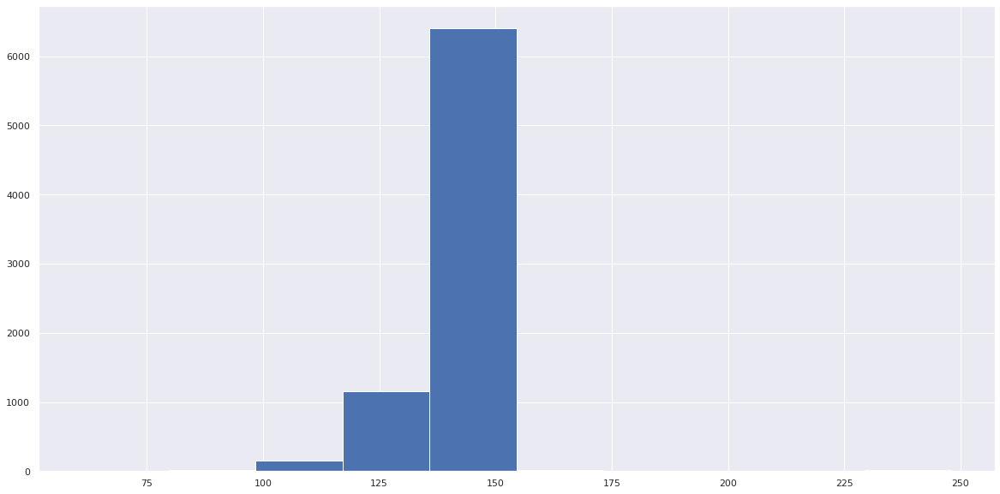

In [69]:
#word length for description column
word_length(data,'description')

A histogram is a display of statistical information that uses rectangles to show the frequency of data items in successive numerical intervals of equal size.

#Key insights

Most of the row length of description column lies between 135 and 155.

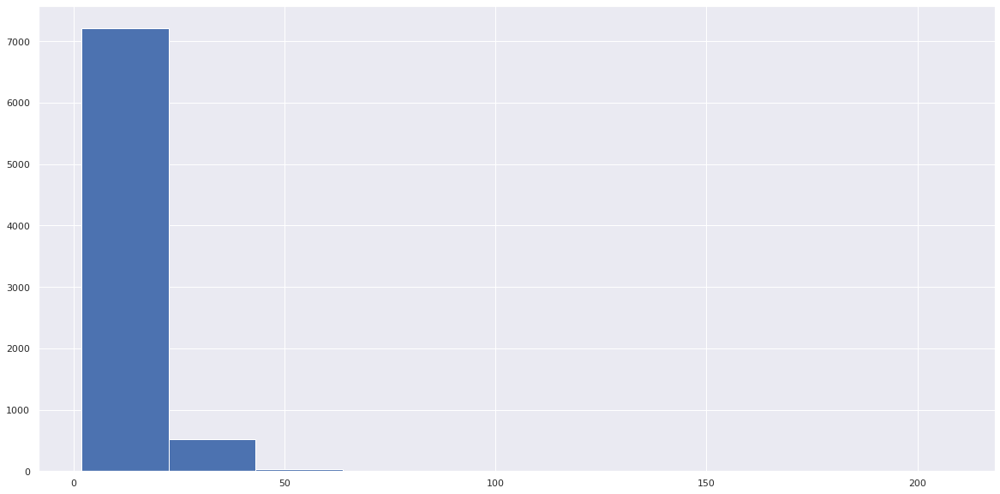

In [70]:
#word length for director column
word_length(data,'director')

A histogram is a display of statistical information that uses rectangles to show the frequency of data items in successive numerical intervals of equal size.

#Key insights

Most of the row length of director column lies between 0 and 25.

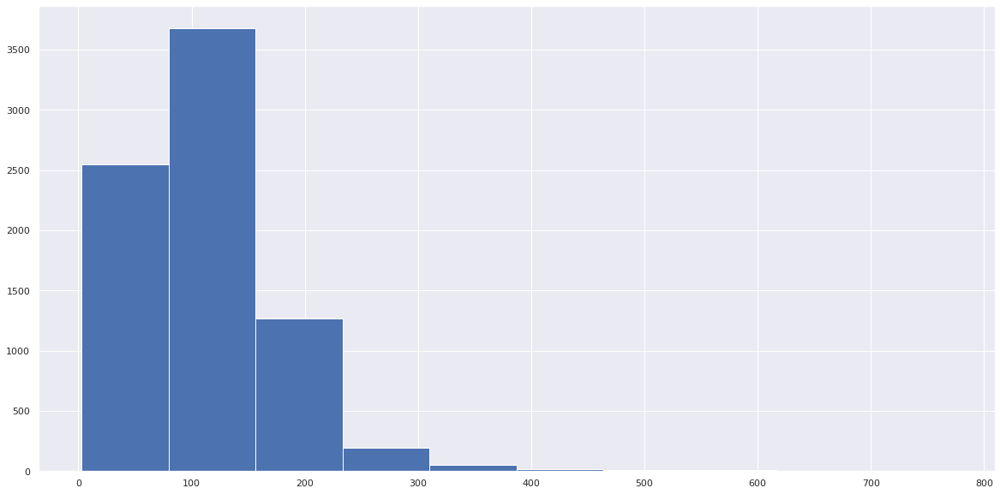

In [71]:
#calling function to get word length of cast column
word_length(data,'cast')

A histogram is a display of statistical information that uses rectangles to show the frequency of data items in successive numerical intervals of equal size.

#Key insights

Most of the row length of cast column lies between 90 and 150.

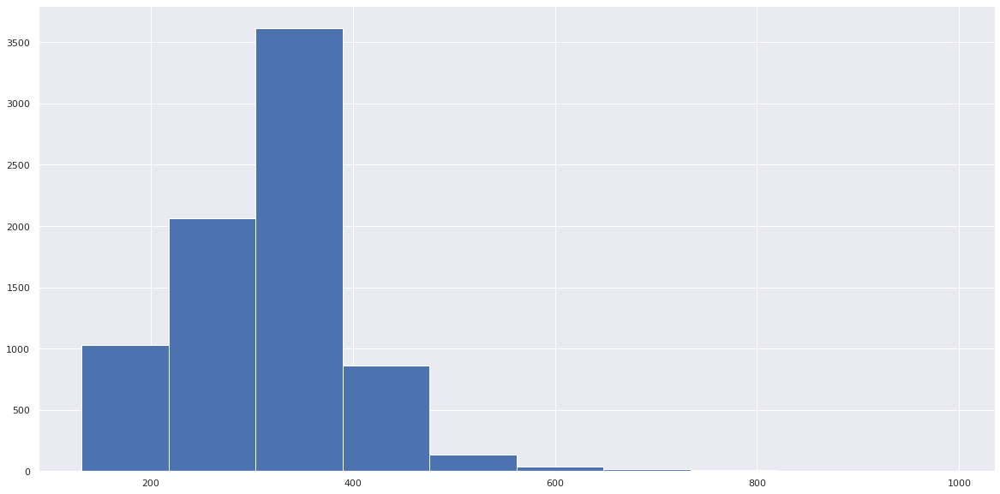

In [72]:
#calling word length function to get length of rows of filtered column
word_length(data,'filtered')

A histogram is a display of statistical information that uses rectangles to show the frequency of data items in successive numerical intervals of equal size.

#Key insights

Most of the row length of director column lies between 300 and 400.

## Text Preprocessing

In [73]:
#text cleaning
import re
def cleaned(x):
    return re.sub(r"[^a-zA-Z ]","",str(x))
data['filtered'] = data['filtered'].apply(cleaned)

In [74]:
#make the data in lowercase
data['filtered' ]= data['filtered'].str.lower()

In [75]:
#importing necessary libraryfor nlp
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem.snowball import SnowballStemmer
nltk.download('punkt')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [76]:
#calling the stemmer and stopwords
stemmer = SnowballStemmer('english')
stop_words = set(stopwords.words('english'))

In [77]:
list(stop_words)

['yourself',
 'once',
 'won',
 'other',
 'are',
 'only',
 'me',
 'd',
 'was',
 'before',
 'theirs',
 'their',
 'a',
 'aren',
 'what',
 'most',
 "wasn't",
 "weren't",
 'further',
 'below',
 'ourselves',
 'where',
 'again',
 'some',
 'ma',
 'not',
 'so',
 'between',
 'why',
 'this',
 'on',
 'of',
 'themselves',
 'mustn',
 'don',
 'own',
 "doesn't",
 're',
 'do',
 "you've",
 "you'd",
 'when',
 'who',
 'mightn',
 'or',
 'our',
 "needn't",
 'have',
 "couldn't",
 'y',
 "aren't",
 'is',
 'whom',
 'over',
 'too',
 "should've",
 'its',
 'from',
 'we',
 'after',
 "didn't",
 'an',
 'your',
 'didn',
 'ours',
 "you'll",
 'it',
 'both',
 'll',
 'at',
 'up',
 'o',
 'any',
 'until',
 'had',
 "it's",
 'having',
 "shouldn't",
 'you',
 'and',
 'm',
 'against',
 'no',
 'couldn',
 "mightn't",
 'same',
 "she's",
 "that'll",
 'by',
 'i',
 'his',
 'off',
 'such',
 'those',
 'each',
 'am',
 'the',
 'they',
 'under',
 'now',
 've',
 'can',
 'does',
 'with',
 'very',
 'just',
 'hadn',
 'her',
 'down',
 'ain',
 '

In [78]:
#final word filter to be applied 
def wordfilter(string, filtwords):
    filtered = []
    tokens = word_tokenize(string) 
    for word in tokens:
        if word not in filtwords:
            filtered.append(stemmer.stem(word))
    return filtered

data['filtered_new'] = ''
for item, row in data.iterrows():
    data.at[item, 'filtered_new'] = wordfilter(row['filtered'], stop_words)
    
data['filtered_new']

0       [futur, elit, inhabit, island, paradis, far, c...
1       [devast, earthquak, hit, mexico, citi, trap, s...
2       [armi, recruit, found, dead, fellow, soldier, ...
3       [postapocalypt, world, ragdol, robot, hide, fe...
4       [brilliant, group, student, becom, cardcount, ...
                              ...                        
7782    [lebanon, civil, war, depriv, zozo, famili, he...
7783    [scrappi, poor, boy, worm, way, tycoon, dysfun...
7784    [documentari, south, african, rapper, nasti, c...
7785    [dessert, wizard, adriano, zumbo, look, next, ...
7786    [documentari, delv, mystiqu, behind, bluesrock...
Name: filtered_new, Length: 7777, dtype: object

In [79]:
#create function to join string again
def join_words(x):
  return " ".join(x)

In [80]:
#final column after applying joining function
data['filtered_new'] = data['filtered_new'].apply(join_words)

In [113]:
data.head(5)

##TFIDF Vectorization

In [82]:
#tfidf vectorization
from sklearn.feature_extraction.text import TfidfVectorizer
t_vectorizer = TfidfVectorizer(max_df = 0.9,min_df = 1, max_features=15000)
words = data.filtered_new
X= t_vectorizer.fit_transform(words)

## PCA for Dimensionality Reduction

In [83]:
#PCA technique
from sklearn.decomposition import PCA
transformer = PCA()
transformer.fit(X.toarray())

PCA()

Text(0, 0.5, 'cumulative explained variance')

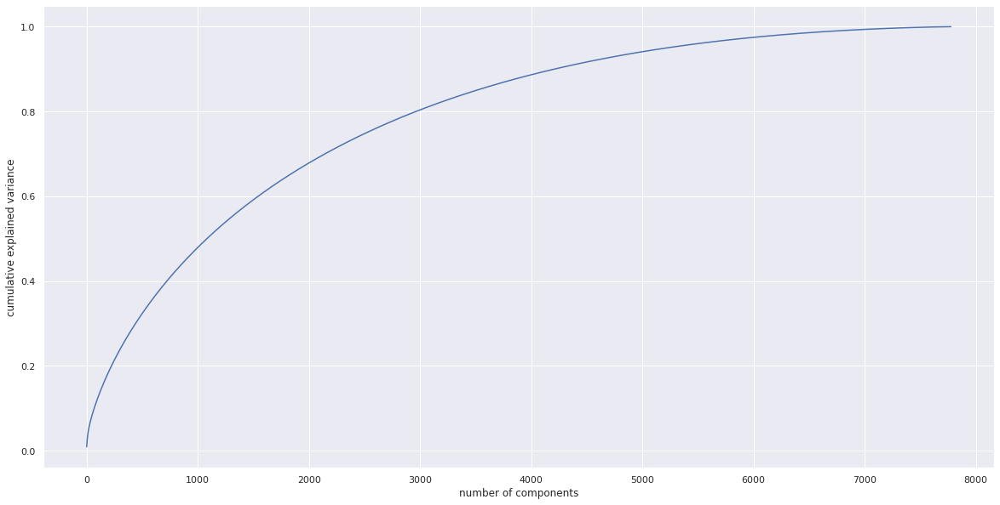

In [84]:
#explained var v/s comp
plt.plot(np.cumsum(transformer.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')

We find that 100% of the variance is explained by about ~7500 components.
Also, more than 80% of the variance is explained just by 3000 components.
Hence to simplify the model, and reduce dimensionality, we can take the top 3000 components, which will still be able to capture more than 80% of variance.

In [85]:
# using n_components = 3000
transformer = PCA(n_components=3000,random_state=42)
transformer.fit(X.toarray())
X_transformed = transformer.transform(X.toarray())
X_transformed.shape

(7777, 3000)

In [86]:
# vectorizing the test and train
X_vectorized = t_vectorizer.transform(words)

In [87]:
#applying pca
X_pca= transformer.transform(X_vectorized.toarray())

In [88]:
X_pca

array([[ 0.10081483, -0.0273658 , -0.01280716, ...,  0.00686537,
         0.02124631,  0.01026605],
       [-0.04726908, -0.04164163,  0.01210596, ...,  0.00095619,
         0.00199659,  0.00530271],
       [-0.0527668 , -0.05159757, -0.02614934, ...,  0.01051517,
        -0.0094844 , -0.00124224],
       ...,
       [-0.05174284,  0.09459034,  0.27119834, ..., -0.00252412,
         0.0100038 , -0.0091335 ],
       [ 0.0957446 ,  0.01071019,  0.01711383, ..., -0.00111816,
         0.02060463, -0.00408099],
       [-0.06840501,  0.26761205,  0.31027979, ..., -0.00430611,
        -0.00469714, -0.00241432]])

# K Means Clustering

In [89]:
from pandas.core.common import random_state
#importing necessary library
from sklearn.cluster import KMeans
  

Text(0, 0.5, 'WCSS')

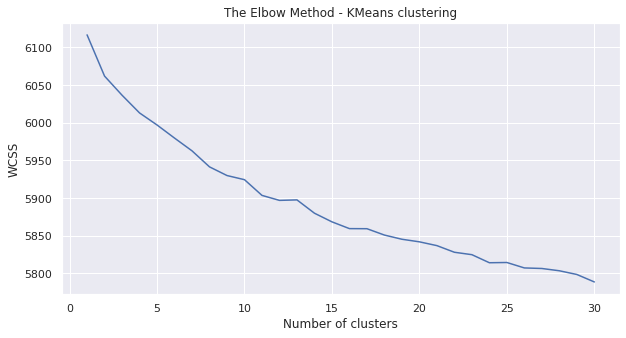

In [90]:
# Elbow method to find the optimal value of k
wcss=[]
for i in range(1,31):
  kmeans = KMeans(n_clusters=i,init='k-means++',random_state=33)
  kmeans.fit(X_pca)
  wcss_iter = kmeans.inertia_
  wcss.append(wcss_iter)

number_clusters = range(1,31)
plt.figure(figsize=(10,5))
plt.plot(number_clusters,wcss)
plt.title('The Elbow Method - KMeans clustering')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')

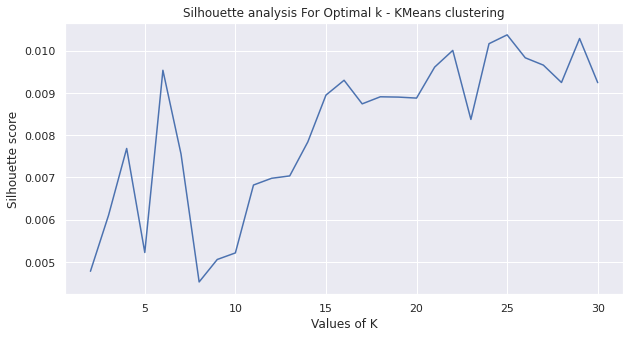

In [92]:
# Plotting Silhouette score for different umber of clusters
from sklearn.metrics import silhouette_score
range_n_clusters = range(2,31)
silhouette_avg = []
for num_clusters in range_n_clusters:
  # initialize kmeans
  kmeans = KMeans(n_clusters=num_clusters,init='k-means++',random_state=33)
  kmeans.fit(X_pca)
  cluster_labels = kmeans.labels_
 
  # silhouette score
  silhouette_avg.append(silhouette_score(X_pca, cluster_labels))

plt.figure(figsize=(10,5))
plt.plot(range_n_clusters,silhouette_avg)
plt.xlabel('Values of K') 
plt.ylabel('Silhouette score')
plt.title('Silhouette analysis For Optimal k - KMeans clustering')
plt.show()

From both the above plots, we have experimented,the value of k could be 6 and 25 but chosen 6 as optimal value of k for low computation cost.

In [93]:
# fitting the k means algorithm with k=6
kmeans= KMeans(n_clusters=6, init= 'k-means++',max_iter=300,random_state=33)
kmeans.fit(X)

KMeans(n_clusters=6, random_state=33)

In [94]:
# Evaluation metrics - distortion, Silhouette score
kmeans_distortion = kmeans.inertia_
kmeans_silhouette_score = silhouette_score(X_pca, kmeans.labels_)

print((kmeans_distortion,kmeans_silhouette_score))

(7516.370809020005, 0.008008569959763599)


In [95]:
from sklearn.metrics import silhouette_score
print("Silhouette Coefficient:  %0.3f"%silhouette_score(X, kmeans.labels_))

Silhouette Coefficient:  0.007


In [96]:
#predict the labels of clusters.
label = kmeans.fit_predict(X)

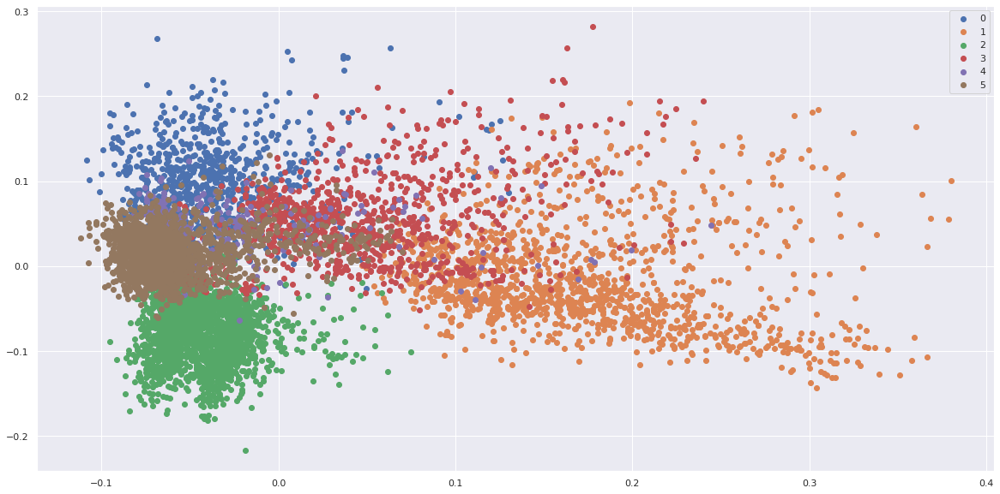

In [97]:
#Getting unique labels
unique_labels = np.unique(label)
#plotting the results:
for i in unique_labels:
    plt.scatter(X_pca[label == i , 0] , X_pca[label == i , 1] , label = i)
plt.legend()
plt.show()

## Labelling the dataset as per the cluster

In [98]:
# kmeans label to cluster column
data['cluster'] = kmeans.labels_

In [99]:
data.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,year_added,month_added,country_list,filtered,filtered_new,cluster
0,s1,TV Show,3%,Unknown,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,2020-08-14,2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,2020,8,[Brazil],in a future where the elite inhabit an island ...,futur elit inhabit island paradis far crowd sl...,1
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016-12-23,2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,2016,12,[Mexico],after a devastating earthquake hits mexico cit...,devast earthquak hit mexico citi trap survivor...,2
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2018-12-20,2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",2018,12,[Singapore],when an army recruit is found dead his fellow ...,armi recruit found dead fellow soldier forc co...,2
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,2017-11-16,2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",2017,11,[United States],in a postapocalyptic world ragdoll robots hide...,postapocalypt world ragdol robot hide fear dan...,5
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,2020-01-01,2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...,2020,1,[United States],a brilliant group of students become cardcount...,brilliant group student becom cardcount expert...,5


#Naming the clusters using word cloud.

#Cluster 0 : on the basis of genres or listed in

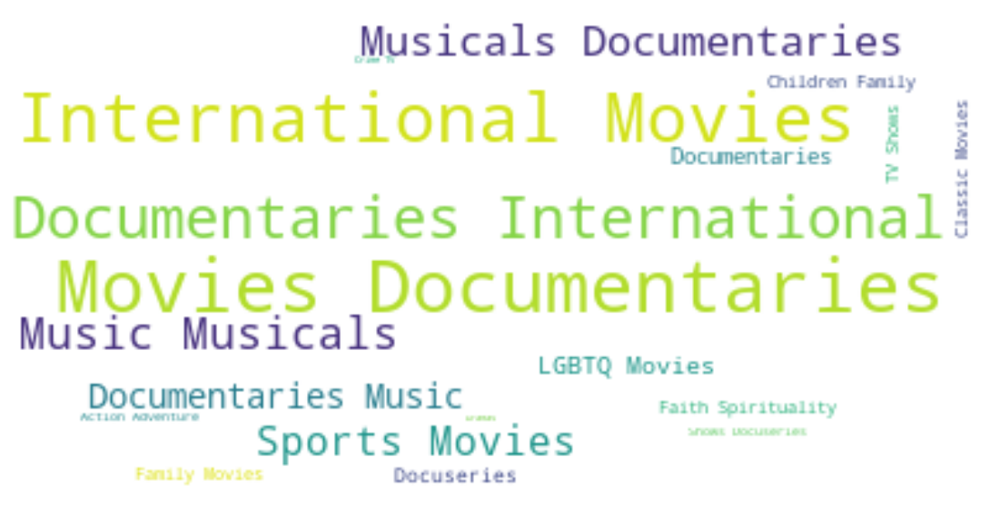

In [100]:
#calling the word cloud function
func_select_Category(0,'cluster','listed_in')

Cluster 0 :- International, Movies, Documentaries

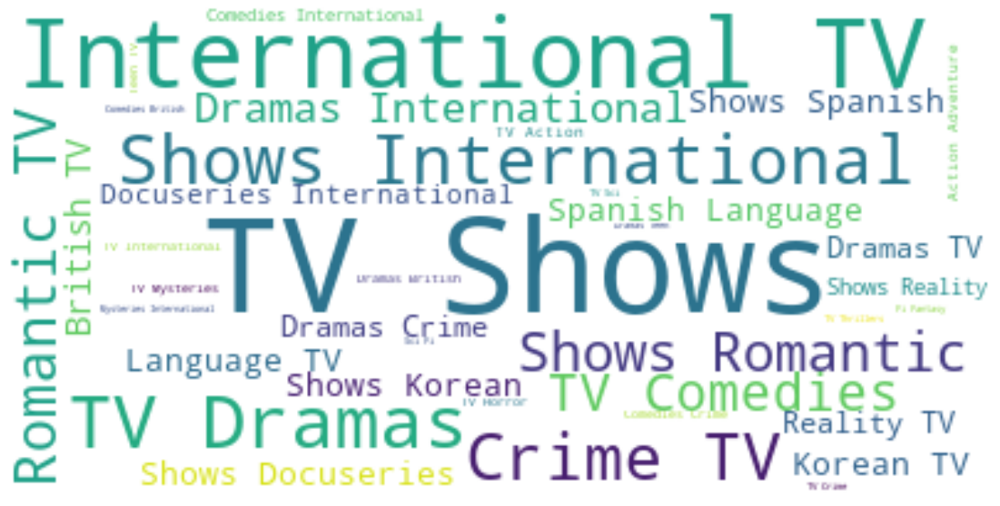

In [101]:
#cluster 1
#calling the word cloud function
func_select_Category(1,'cluster','listed_in')

cluster 1 :- TV,Shows,International,crime,dramas

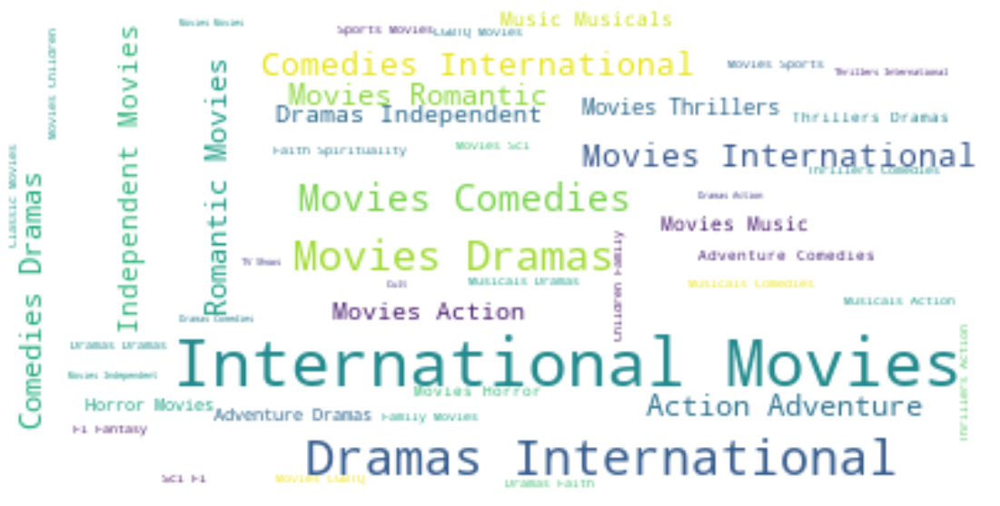

In [102]:
#cluster 2
#calling the word cloud function
func_select_Category(2,'cluster','listed_in')

Cluster 2 : International,Movies,Dramas

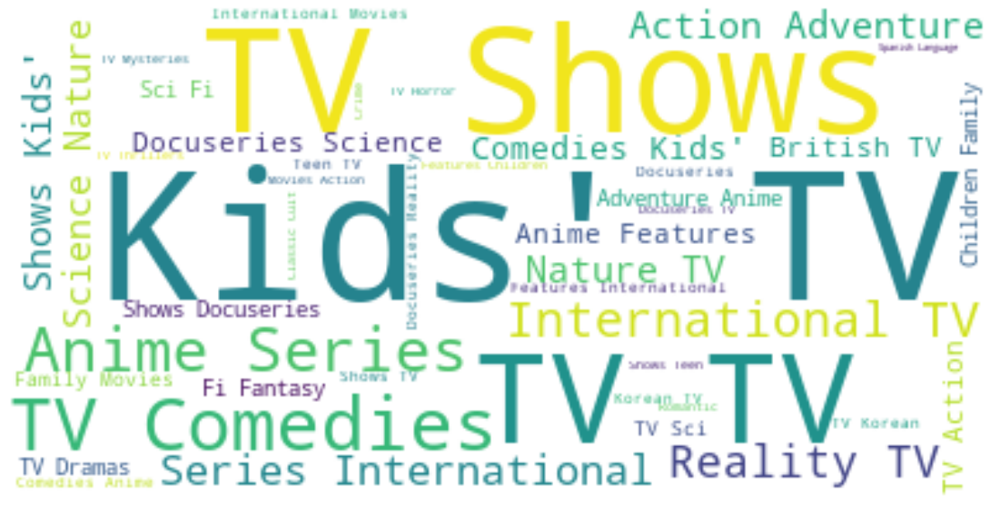

In [103]:
#cluster 3
#calling the word cloud function
func_select_Category(3,'cluster','listed_in')

cluster 3 :TV, Shows,Kids

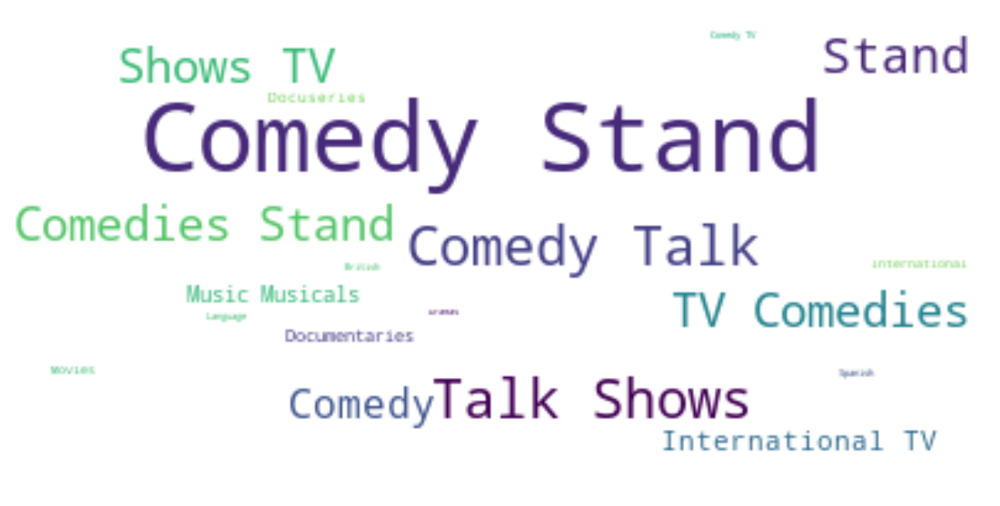

In [104]:
#cluster 4
#calling the word cloud function
func_select_Category(4,'cluster','listed_in')

cluster 4: Comedy,stand,talk

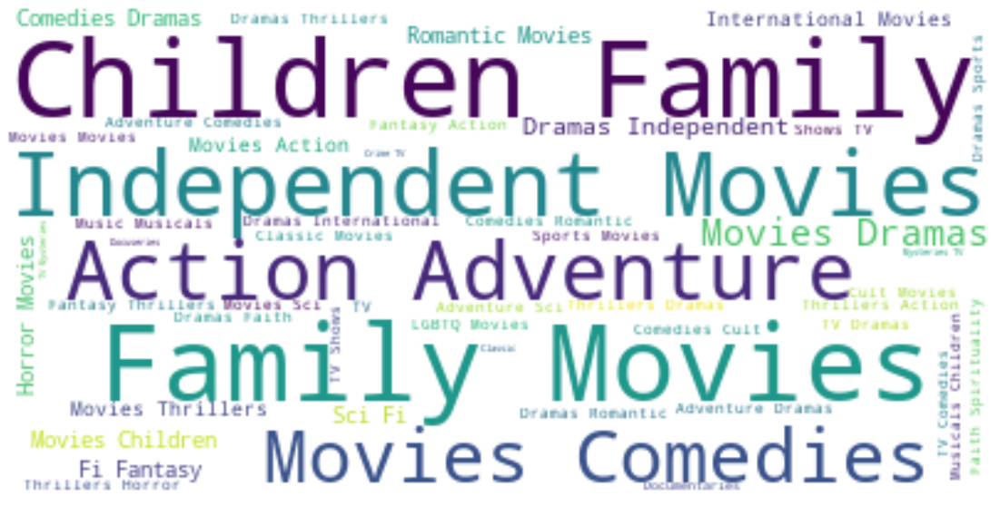

In [105]:
#Cluster 5
#calling the word cloud function
func_select_Category(5,'cluster','listed_in')

cluster 5: Children,Family,Action,Adventure,comedies,independent.

#On the basis of description

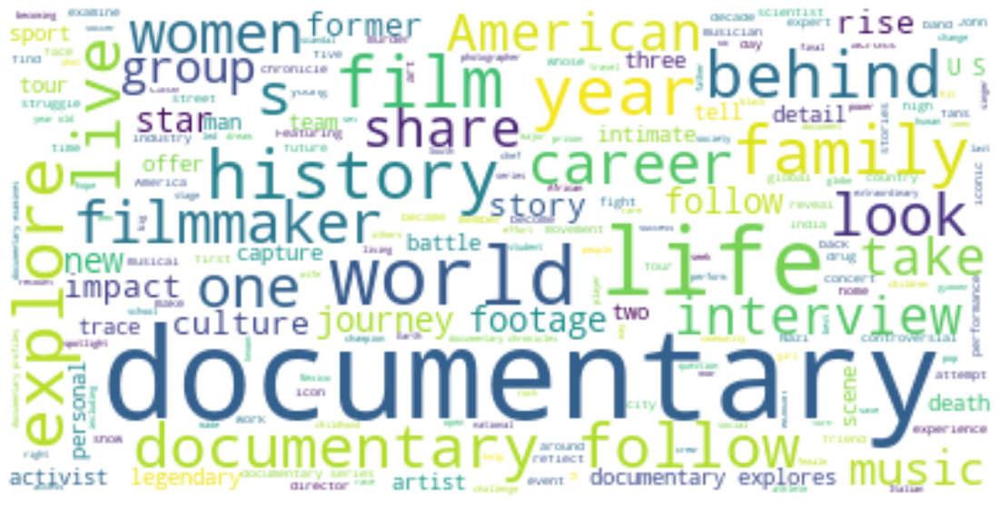

In [106]:
#calling the word cloud function
func_select_Category(0,'cluster','description')

cluster 0 :- documentary

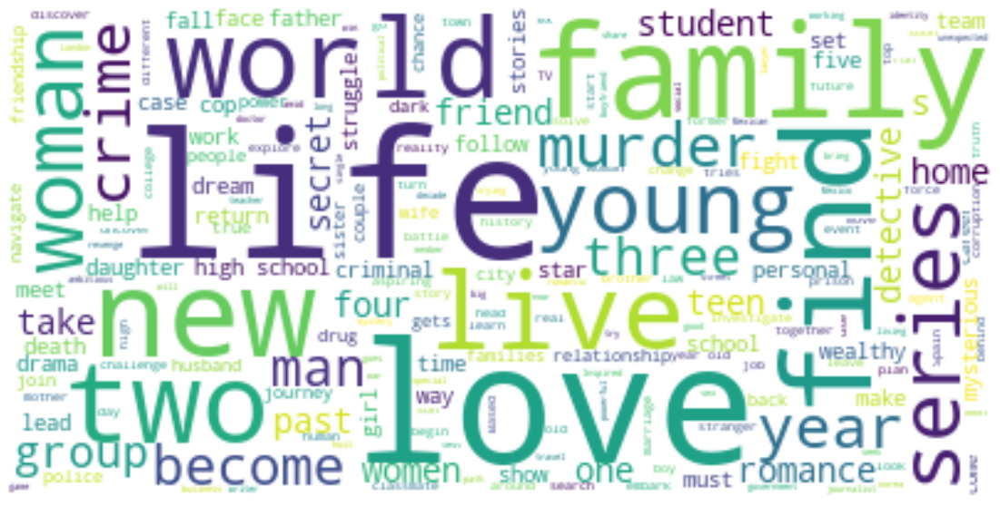

In [107]:
#cluster 1
#calling the word cloud function
func_select_Category(1,'cluster','description')

cluster 1 : world,family,love,life

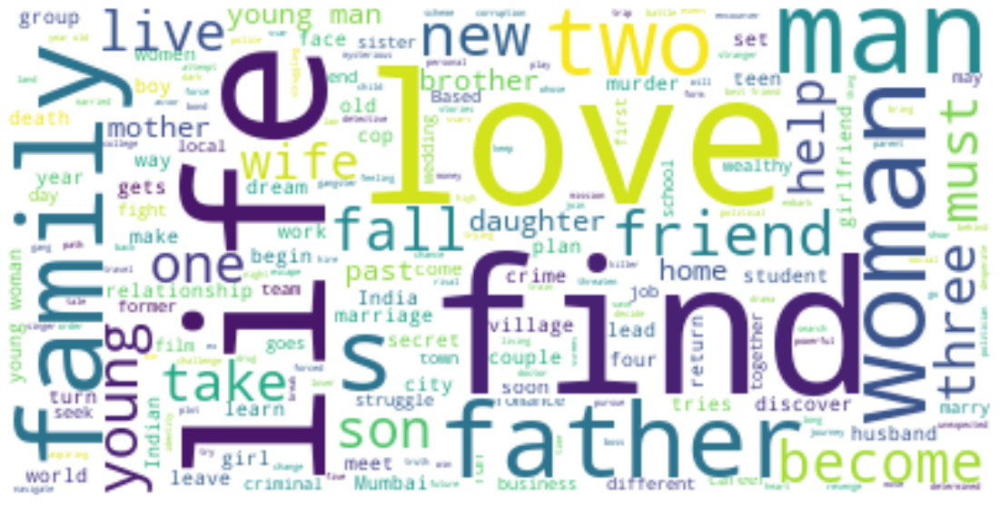

In [108]:
#cluster 2
#calling the word cloud function
func_select_Category(2,'cluster','description')

cluster 2: love,life,find,father.

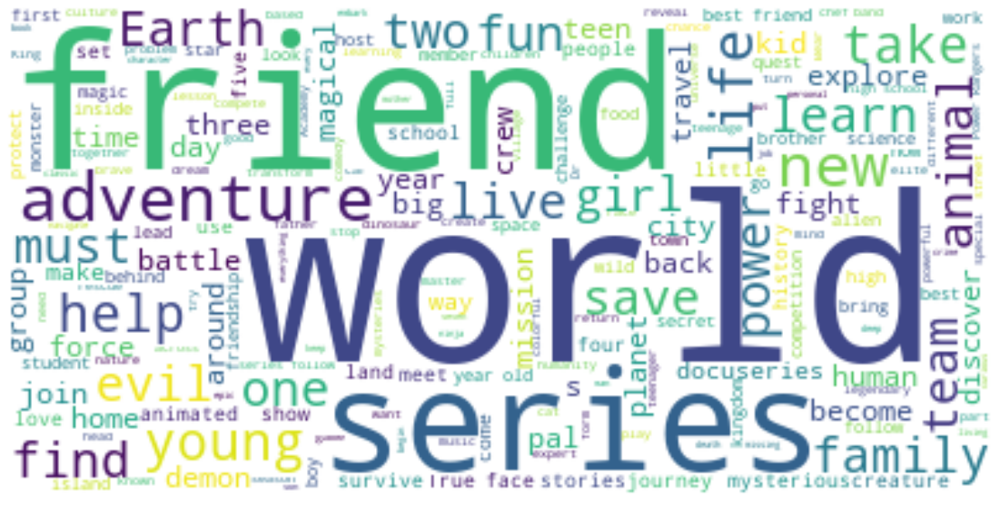

In [109]:
#cluster 3
#calling the word cloud function
func_select_Category(3,'cluster','description')

cluster 3: world,friend,series.

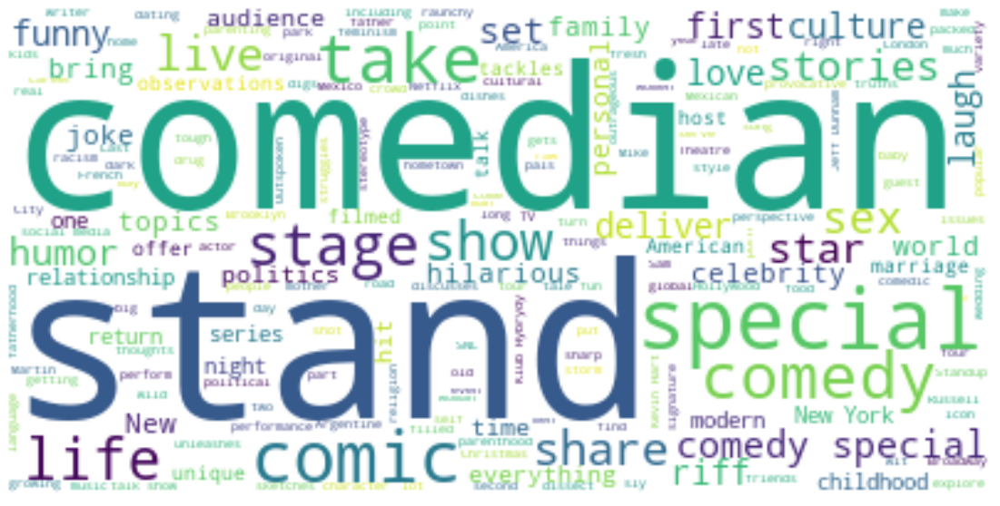

In [110]:
#cluster 4
#calling the word cloud function
func_select_Category(4,'cluster','description')

cluster 4: comedian,stand

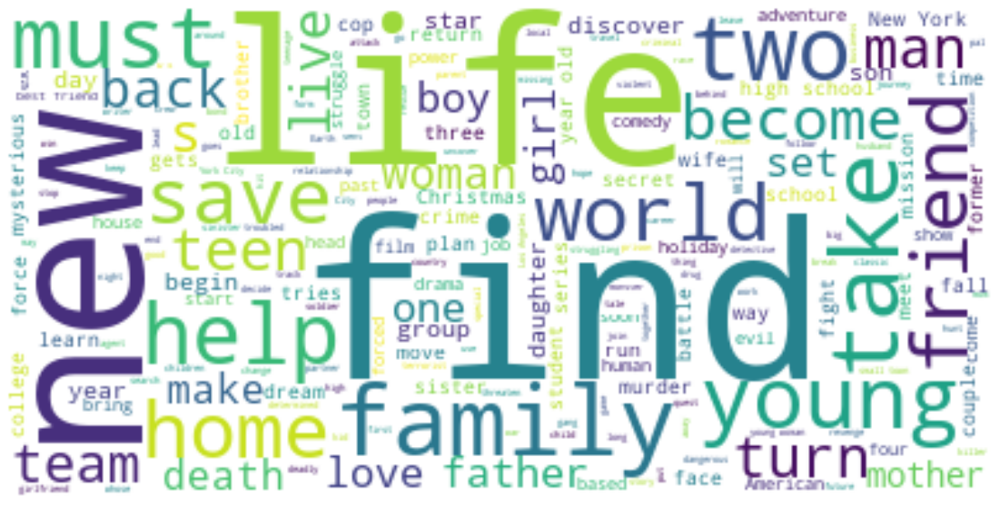

In [111]:
#cluster 5
#calling the word cloud function
func_select_Category(5,'cluster','description')

cluster 5: family,life,new,find

#Selected name of clusters

After playing with word cloud with different columns, i choose cluster name on the basis of genres or listed in column

Cluster 0 :- International Documentary.

Cluster 1 :- Crime and Dramas.

Cluster 2 : International Movies.

Cluster 3 : Kids' Shows.

Cluster 4: Comedy.

Cluster 5: Action and Adventure.


# **Conclusion**

1) In this project, we worked on a text clustering problem wherein we had to classify/group the Netflix shows into certain clusters such that the shows within a cluster are similar to each other and the shows in different clusters are dissimilar to each other.


2) The dataset contained about 7787 records, and 12 attributes.
We began by dealing with the dataset's missing values and doing exploratory data analysis (EDA).


3) It was found that Netflix hosts more movies than TV shows on its platform, and the total number of shows added on Netflix is growing exponentially. Also, majority of the shows were produced in the United States, and the majority of the shows on Netflix were created for adults and young adults age group.


4)It was decided to cluster the data based on the attributes: director, cast, country, genre, and description. The values in these attributes were tokenized, preprocessed, and then vectorized using TFIDF vectorizer.


5)Through TFIDF Vectorization, we created a total of 20000 attributes.


6)We used Principal Component Analysis (PCA) to handle the curse of dimensionality. 3000 components were able to capture more than 80% of variance, and hence, the number of components were restricted to 3000.